In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import date
from scipy import stats
from scipy.stats import norm, skew #for some statistics

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
plt.style.use('seaborn')

In [ ]:
df = pd.read_csv('investments_VC.csv',encoding= 'unicode_escape')

In [ ]:
df.columns


Index(['permalink', 'name', 'homepage_url', 'category_list', ' market ',
       ' funding_total_usd ', 'status', 'country_code', 'state_code', 'region',
       'city', 'funding_rounds', 'founded_at', 'founded_month',
       'founded_quarter', 'founded_year', 'first_funding_at',
       'last_funding_at', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'debt_financing', 'angel', 'grant',
       'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'round_G', 'round_H'],
      dtype='object')

In [ ]:
#NUMERICAL DATA

numeric=['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_num=df.select_dtypes(include=numeric)
df_num.head(3)

,funding_rounds,founded_year,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H
0,1.0,2012.0,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,NaN,0.0,4000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,2012.0,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#CATEGORICAL DATA

df_cat=df.select_dtypes(include='object')
df_cat.head(3)

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,state_code,region,city,founded_at,founded_month,founded_quarter,first_funding_at,last_funding_at
0,/organization/waywire,#waywire,http://www.waywire.com,|Entertainment|Politics|Social Media|News|,News,"17,50,000",acquired,USA,NY,New York City,New York,2012-06-01,2012-06,2012-Q2,2012-06-30,2012-06-30
1,/organization/tv-communications,&TV Communications,http://enjoyandtv.com,|Games|,Games,"40,00,000",operating,USA,CA,Los Angeles,Los Angeles,NaN,NaN,NaN,2010-06-04,2010-09-23
2,/organization/rock-your-paper,'Rock' Your Paper,http://www.rockyourpaper.org,|Publishing|Education|,Publishing,"40,000",operating,EST,NaN,Tallinn,Tallinn,2012-10-26,2012-10,2012-Q4,2012-08-09,2012-08-09


In [ ]:
df.columns = df.columns.str.replace(' ', '')
df.columns

Index(['permalink', 'name', 'homepage_url', 'category_list', 'market',
       'funding_total_usd', 'status', 'country_code', 'state_code', 'region',
       'city', 'funding_rounds', 'founded_at', 'founded_month',
       'founded_quarter', 'founded_year', 'first_funding_at',
       'last_funding_at', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'debt_financing', 'angel', 'grant',
       'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'round_G', 'round_H'],
      dtype='object')

In [ ]:
df['funding_total_usd'].head(15)

0      17,50,000 
1      40,00,000 
2         40,000 
3      15,00,000 
4         60,000 
5      70,00,000 
6      49,12,393 
7      20,00,000 
8            -   
9         41,250 
10        40,000 
11           -   
12           -   
13     17,50,000 
14           -   
Name: funding_total_usd, dtype: object

In [ ]:
df['funding_total_usd'] = df['funding_total_usd'].str.replace(',','')
df['funding_total_usd'].head(15)

0      1750000 
1      4000000 
2        40000 
3      1500000 
4        60000 
5      7000000 
6      4912393 
7      2000000 
8          -   
9        41250 
10       40000 
11         -   
12         -   
13     1750000 
14         -   
Name: funding_total_usd, dtype: object

In [ ]:
df['funding_total_usd'] = df['funding_total_usd'].str.replace('-','0')
df['funding_total_usd'].head(15)

0      1750000 
1      4000000 
2        40000 
3      1500000 
4        60000 
5      7000000 
6      4912393 
7      2000000 
8          0   
9        41250 
10       40000 
11         0   
12         0   
13     1750000 
14         0   
Name: funding_total_usd, dtype: object

In [ ]:
df['funding_total_usd']=df['funding_total_usd'].str.replace(' ','')
df['funding_total_usd'].head(15)

0     1750000
1     4000000
2       40000
3     1500000
4       60000
5     7000000
6     4912393
7     2000000
8           0
9       41250
10      40000
11          0
12          0
13    1750000
14          0
Name: funding_total_usd, dtype: object

In [ ]:
df['funding_total_usd'] = pd.to_numeric(df['funding_total_usd'])#converted to numeric

In [ ]:
df = df.drop(["founded_month","founded_quarter","founded_year"],axis=1)#We can use founded_at column and get rid of other similar informations as founded_month,founded_quarter,founded_year. Rest of histarical data would be enough.

In [ ]:
#let' convert rest to date time
df['first_funding_at'] = pd.to_datetime(df["first_funding_at"], format="%Y-%m-%d", exact=False, errors='coerce')
df['last_funding_at'] = pd.to_datetime(df["last_funding_at"], format="%Y-%m-%d", exact=False, errors='coerce')
df['founded_at'] = pd.to_datetime(df["founded_at"], format="%Y-%m-%d", exact=False, errors='coerce')
df.dtypes

permalink                       object
name                            object
homepage_url                    object
category_list                   object
market                          object
funding_total_usd              float64
status                          object
country_code                    object
state_code                      object
region                          object
city                            object
funding_rounds                 float64
founded_at              datetime64[ns]
first_funding_at        datetime64[ns]
last_funding_at         datetime64[ns]
seed                           float64
venture                        float64
equity_crowdfunding            float64
undisclosed                    float64
convertible_note               float64
debt_financing                 float64
angel                          float64
grant                          float64
private_equity                 float64
post_ipo_equity                float64
post_ipo_debt            

In [ ]:
#We are importing country codes to identify which code refers which country
country = pd.read_csv('wikipedia-iso-country-codes.csv')
country.head()

,English short name lower case,Alpha-2 code,Alpha-3 code,Numeric code,ISO 3166-2
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX
2,Albania,AL,ALB,8,ISO 3166-2:AL
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ
4,American Samoa,AS,ASM,16,ISO 3166-2:AS


In [ ]:
country[country['Alpha-3 code']== 'EST']

,English short name lower case,Alpha-2 code,Alpha-3 code,Numeric code,ISO 3166-2
67,Estonia,EE,EST,233,ISO 3166-2:EE


In [ ]:
country = country[['English short name lower case','Alpha-3 code']]
country.head()

,English short name lower case,Alpha-3 code
0,Afghanistan,AFG
1,Åland Islands,ALA
2,Albania,ALB
3,Algeria,DZA
4,American Samoa,ASM


In [ ]:
country.columns = ['country','country_code']
country.head()

,country,country_code
0,Afghanistan,AFG
1,Åland Islands,ALA
2,Albania,ALB
3,Algeria,DZA
4,American Samoa,ASM


In [ ]:
df.shape

(54294, 36)

In [ ]:
df = df.merge(country,on='country_code',how='left')
df.shape

(54294, 37)

DATA ANALYSIS
before analysis let's remove duplicates if there is any

In [ ]:
df.shape

(54294, 37)

In [ ]:
df = df.drop_duplicates()
df.shape

(49439, 37)

In [ ]:
df.nunique()

permalink               49436
name                    49350
homepage_url            45850
category_list           16675
market                    753
funding_total_usd       14617
status                      3
country_code              115
state_code                 61
region                   1089
city                     4188
funding_rounds             17
founded_at               3368
first_funding_at         3904
last_funding_at          3651
seed                     3337
venture                  9300
equity_crowdfunding       252
undisclosed               687
convertible_note          299
debt_financing           1872
angel                     999
grant                     532
private_equity            847
post_ipo_equity           239
post_ipo_debt              57
secondary_market           20
product_crowdfunding      176
round_A                  2035
round_B                  1269
round_C                   740
round_D                   458
round_E                   225
round_F   

**Observations**
* permalink is unique for each company
* status is target


In [ ]:
df.groupby('status')['name'].nunique()

status
acquired      3691
closed        2602
operating    41762
Name: name, dtype: int64

In [ ]:
df.groupby('status')['funding_rounds'].describe()

,count,mean,std,min,25%,50%,75%,max
status,,,,,,,,
acquired,3692.0,2.013814,1.398832,1.0,1.0,2.0,3.0,15.0
closed,2603.0,1.434114,0.965478,1.0,1.0,1.0,2.0,11.0
operating,41829.0,1.689522,1.302072,1.0,1.0,1.0,2.0,18.0


In [ ]:
df.groupby('status')[['funding_rounds', 'funding_total_usd', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'debt_financing', 'angel', 'grant',
       'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'round_G', 'round_H']].mean().T

status,acquired,closed,operating
funding_rounds,2.013814e+00,1.434114e+00,1.689522e+00
funding_total_usd,2.075578e+07,7.023194e+06,1.295244e+07
seed,1.783670e+05,1.415031e+05,2.275289e+05
venture,1.385521e+07,5.212253e+06,7.194281e+06
equity_crowdfunding,2.406028e+03,0.000000e+00,6.984983e+03
undisclosed,1.559854e+05,3.732560e+04,1.304164e+05
convertible_note,6.423306e+03,1.012430e+04,2.587812e+04
debt_financing,1.905123e+06,6.263045e+05,1.989447e+06
angel,6.677897e+04,7.328595e+04,6.554313e+04
grant,2.570494e+04,5.857066e+04,1.811988e+05


In [ ]:
df = df.drop(["state_code"],axis=1)
df.dtypes

permalink                       object
name                            object
homepage_url                    object
category_list                   object
market                          object
funding_total_usd              float64
status                          object
country_code                    object
region                          object
city                            object
funding_rounds                 float64
founded_at              datetime64[ns]
first_funding_at        datetime64[ns]
last_funding_at         datetime64[ns]
seed                           float64
venture                        float64
equity_crowdfunding            float64
undisclosed                    float64
convertible_note               float64
debt_financing                 float64
angel                          float64
grant                          float64
private_equity                 float64
post_ipo_equity                float64
post_ipo_debt                  float64
secondary_market         

In [ ]:
df[['region','country_code']].isnull().sum()

region          5274
country_code    5274
dtype: int64

In [ ]:
df.groupby('country')['name'].nunique().sort_values(ascending=False).head(30)

country
United States Of America            28756
United Kingdom                       2642
Canada                               1405
China                                1238
Germany                               966
France                                866
India                                 849
Israel                                681
Spain                                 549
Russia                                368
Sweden                                315
Australia                             314
Italy                                 308
Netherlands                           307
Ireland                               306
Singapore                             299
Brazil                                293
Chile                                 285
Japan                                 283
Korea, Republic of (South Korea)      246
Switzerland                           222
Denmark                               210
Finland                               194
Belgium                   

In [ ]:
df.groupby('region')['name'].count().sort_values(ascending = False).head(10)

region
SF Bay Area         6804
New York City       2577
Boston              1837
London              1588
Los Angeles         1389
Seattle              932
Washington, D.C.     785
Chicago              749
San Diego            700
Denver               636
Name: name, dtype: int64

In [ ]:
df[(df['country_code'].isnull() & df['country'].isnull() & df['city'].isnull() & df['region'].isnull())]

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country
7,/organization/0-6-com,0-6.com,http://www.0-6.com,|Curated Web|,Curated Web,2.000000e+06,operating,NaN,NaN,NaN,1.0,2007-01-01,2008-03-19,2008-03-19,0.0,2000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,2000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
18,/organization/1000-markets,1000 Markets,http://www.1000markets.com,|Marketplaces|Art|E-Commerce|,Marketplaces,5.000000e+05,acquired,NaN,NaN,NaN,1.0,2009-01-01,2009-05-15,2009-05-15,500000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
24,/organization/100du-tv,100du.tv,http://www.100du.com,|Hospitality|,Hospitality,3.000000e+06,operating,NaN,NaN,NaN,2.0,NaT,2008-01-07,2010-08-13,0.0,3000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,3000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
31,/organization/10sec,10sec,http://10s.ec/,|Social Commerce|E-Commerce|Mobile Commerce|,Mobile Commerce,1.600000e+06,operating,NaN,NaN,NaN,2.0,2013-07-08,2013-10-31,2014-05-08,1600000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
36,/organization/115-network-disks,115 network disks,http://www.115.com/,|Education|,Education,0.000000e+00,operating,NaN,NaN,NaN,1.0,NaT,2011-11-01,2011-11-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
39,/organization/fitfrnd-2,12 Labs,http://www.12labs.com/,|Personal Health|Health and Wellness|,Personal Health,0.000000e+00,operating,NaN,NaN,NaN,1.0,NaT,NaT,NaT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
40,/organization/12-star-survival,12 Star Survival,http://www.12starsurvival.com,|Sports|,Sports,0.000000e+00,operating,NaN,NaN,NaN,1.0,2013-07-17,2013-10-17,2013-10-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
45,/organization/1234enter,1234ENTER,http://www.1234enter.com.br,|Small and Medium Businesses|Education|Analyti...,Advertising,6.502670e+05,operating,NaN,NaN,NaN,2.0,2012-01-01,2012-09-01,2013-11-22,500000.0,150267.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
58,/organization/15minutesnow,15MinutesNOW,http://15minutesnow.com,|Games|,Games,2.000000e+05,operating,NaN,NaN,NaN,1.0,2011-04-19,2011-05-10,2011-05-10,200000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
61,/organization/16lab-inc-,16Lab Inc.,http://www.16lab.net,NaN,NaN,0.000000e+00,operating,NaN,NaN,NaN,1.0,2013-04-24,2014-11-26,2014-11-26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [ ]:
df = df.dropna(subset = ['region'])
df[(df['country_code'].isnull() & df['country'].isnull() & df['city'].isnull() & df['region'].isnull())]

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country


In [ ]:
df[df['country']=='Turkey']['permalink'].count()

124

In [ ]:
df.shape

(44165, 36)

In [ ]:
df['status'].isnull().sum()

1108

In [ ]:
df = df.dropna(subset = ['status'])
df.shape

(43057, 36)

In [ ]:
df.isnull().sum()

permalink                  0
name                       0
homepage_url            2689
category_list           2577
market                  2580
funding_total_usd          0
status                     0
country_code               0
region                     0
city                     790
funding_rounds             0
founded_at              8363
first_funding_at           6
last_funding_at            2
seed                       0
venture                    0
equity_crowdfunding        0
undisclosed                0
convertible_note           0
debt_financing             0
angel                      0
grant                      0
private_equity             0
post_ipo_equity            0
post_ipo_debt              0
secondary_market           0
product_crowdfunding       0
round_A                    0
round_B                    0
round_C                    0
round_D                    0
round_E                    0
round_F                    0
round_G                    0
round_H       

In [ ]:
df1 = df.copy()
df1.shape

(43057, 36)

In [ ]:
describeNum = df.describe(include =['float64', 'int64', 'float', 'int'])
describeNum.T.style.background_gradient(cmap='viridis',low=0.2,high=0.1)

,count,mean,std,min,25%,50%,75%,max
funding_total_usd,43057.000000,14219202.810205,164093553.117992,0.000000,100000.000000,1250000.000000,7715715.000000,30079503000.000000
funding_rounds,43057.000000,1.753745,1.342533,1.000000,1.000000,1.000000,2.000000,18.000000
seed,43057.000000,227307.903407,1114965.955922,0.000000,0.000000,0.000000,25000.000000,130000000.000000
venture,43057.000000,8173103.327403,30079125.601045,0.000000,0.000000,0.000000,5500000.000000,2351000000.000000
equity_crowdfunding,43057.000000,6386.684465,206194.089338,0.000000,0.000000,0.000000,0.000000,25000000.000000
undisclosed,43057.000000,113135.020949,2613325.354607,0.000000,0.000000,0.000000,0.000000,259417808.000000
convertible_note,43057.000000,25853.271199,1533539.439560,0.000000,0.000000,0.000000,0.000000,300000000.000000
debt_financing,43057.000000,2101874.061941,148061900.052998,0.000000,0.000000,0.000000,0.000000,30079503000.000000
angel,43057.000000,64685.717421,560032.264075,0.000000,0.000000,0.000000,0.000000,40000000.000000
grant,43057.000000,172668.671227,5921531.613376,0.000000,0.000000,0.000000,0.000000,750500000.000000


In [ ]:
describeNumCat = df.describe(include=["O"])
describeNumCat.T.style.background_gradient(cmap='viridis',low=0.2,high=0.1)

,count,unique,top,freq
permalink,43057,43056,/organization/treasure-valley-urology-services,2
name,43057,42996,Spire,4
homepage_url,40368,40273,http://www.mosync.com,2
category_list,40480,14805,|Biotechnology|,3373
market,40477,736,Software,4242
status,43057,3,operating,37390
country_code,43057,115,USA,28233
region,43057,1086,SF Bay Area,6687
city,42267,4127,San Francisco,2576
country,43035,114,United States Of America,28233


<Axes: >

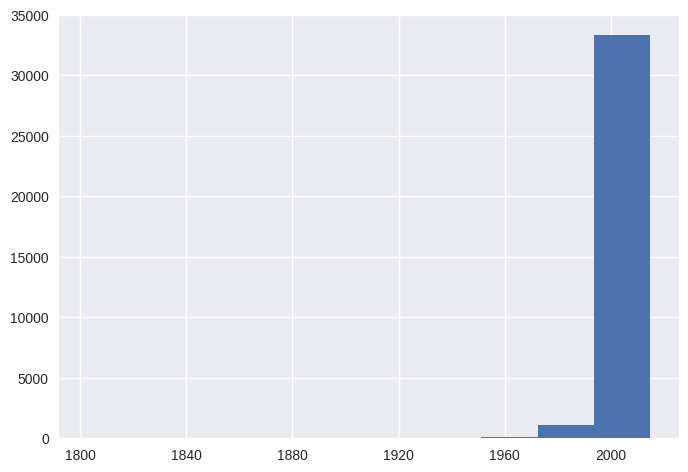

In [ ]:
df1['founded_at'].hist()

In [ ]:
df[df["founded_at"]==df['founded_at'].max()]

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country
23596,/organization/le-herbé,Le Herbé,https://leherbe.com,|Medical Marijuana Patients|Organic Food|Produ...,Medical Marijuana Patients,100000.0,operating,USA,Seattle,Seattle,1.0,2014-12-01,2014-12-01,2014-12-01,0.0,0.0,0.0,100000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America


In [ ]:
df[df["founded_at"]==df['founded_at'].min()]

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country
12463,/organization/dupont,DuPont,http://www.dupont.com,|Business Services|Agriculture|Automotive|Inve...,Business Services,9000000.0,operating,USA,"Wilmington, Delaware",Wilmington,1.0,1802-07-19,2009-07-02,2009-07-02,0.0,9000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America


In [ ]:
df['market'].nunique()

736

In [ ]:
df.groupby('market')['funding_total_usd'].sum().sort_values(ascending = False).head(5)

market
 Biotechnology        6.946837e+10
 Mobile               4.782535e+10
 Software             3.998505e+10
 Clean Technology     3.451340e+10
 Health Care          2.841310e+10
Name: funding_total_usd, dtype: float64

In [ ]:
df.groupby('market')['name'].count().sort_values(ascending = False).head(5)

market
 Software          4242
 Biotechnology     3458
 Mobile            1702
 E-Commerce        1529
 Curated Web       1397
Name: name, dtype: int64

In [ ]:
df.groupby('region')['name'].count().sort_values(ascending = False).head(10)

region
SF Bay Area         6687
New York City       2528
Boston              1807
London              1554
Los Angeles         1368
Seattle              906
Washington, D.C.     780
Chicago              734
San Diego            679
Denver               624
Name: name, dtype: int64

In [ ]:
df.groupby('country')['name'].count().sort_values(ascending = False).head(10)

country
United States Of America    28233
United Kingdom               2595
Canada                       1351
China                        1229
Germany                       939
France                        847
India                         832
Israel                        678
Spain                         527
Sweden                        307
Name: name, dtype: int64

In [ ]:
df.head(20)

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country
0,/organization/waywire,#waywire,http://www.waywire.com,|Entertainment|Politics|Social Media|News|,News,1750000.0,acquired,USA,New York City,New York,1.0,2012-06-01,2012-06-30,2012-06-30,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America
1,/organization/tv-communications,&TV Communications,http://enjoyandtv.com,|Games|,Games,4000000.0,operating,USA,Los Angeles,Los Angeles,2.0,NaT,2010-06-04,2010-09-23,0.0,4000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America
2,/organization/rock-your-paper,'Rock' Your Paper,http://www.rockyourpaper.org,|Publishing|Education|,Publishing,40000.0,operating,EST,Tallinn,Tallinn,1.0,2012-10-26,2012-08-09,2012-08-09,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia
3,/organization/in-touch-network,(In)Touch Network,http://www.InTouchNetwork.com,|Electronics|Guides|Coffee|Restaurants|Music|i...,Electronics,1500000.0,operating,GBR,London,London,1.0,2011-04-01,2011-04-01,2011-04-01,1500000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom
4,/organization/r-ranch-and-mine,-R- Ranch and Mine,NaN,|Tourism|Entertainment|Games|,Tourism,60000.0,operating,USA,Dallas,Fort Worth,2.0,2014-01-01,2014-08-17,2014-09-26,0.0,0.0,60000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America
6,/organization/fox-networks,.Fox Networks,http://www.dotfox.com,|Advertising|,Advertising,4912393.0,closed,ARG,Buenos Aires,Buenos Aires,1.0,NaT,2007-01-16,2007-01-16,0.0,0.0,0.0,4912393.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Argentina
8,/organization/004-technologies,004 Technologies,http://004gmbh.de/en/004-interact,|Software|,Software,0.0,operating,USA,"Springfield, Illinois",Champaign,1.0,2010-01-01,2014-07-24,2014-07-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America
9,/organization/01games-technology,01Games Technology,http://www.01games.hk/,|Games|,Games,41250.0,operating,HKG,Hong Kong,Hong Kong,1.0,NaT,2014-07-01,2014-07-01,41250.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Hong Kong
10,/organization/1-2-3-listo,"1,2,3 Listo",http://www.123listo.com,|E-Commerce|,E-Commerce,40000.0,operating,CHL,Santiago,Las Condes,1.0,2012-01-01,2013-02-18,2013-02-18,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Chile
11,/organization/1-4-all,1-4 All,NaN,|Entertainment|Games|Software|,Software,0.0,operating,USA,NC - Other,Connellys Springs,1.0,NaT,2013-04-21,2013-04-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America


In [ ]:
cat_cols = ['category_list',
 'market',
 'country_code',
 'region',
 'city',
 'country']
cat_cols

['category_list', 'market', 'country_code', 'region', 'city', 'country']

In [ ]:
numerical_cols = ['funding_total_usd',
 'status',
 'funding_rounds',
 'founded_at',
 'first_funding_at',
 'last_funding_at']

numerical_cols

['funding_total_usd',
 'status',
 'funding_rounds',
 'founded_at',
 'first_funding_at',
 'last_funding_at']

In [ ]:
for col in cat_cols:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom category_list:


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
for col in numerical_cols:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Streaming output truncated to the last 5000 lines.
2009-01-05      4
2007-10-25      4
2005-03-18      4
2005-03-28      4
2014-10-18      4
2010-04-04      4
2012-11-03      4
2007-04-25      4
2013-05-19      4
2011-04-10      4
2006-11-17      4
2008-06-06      4
2014-03-08      4
2008-05-30      4
2014-06-08      4
2008-12-11      4
2005-05-03      4
2000-03-31      4
2007-12-21      4
2014-08-16      4
2007-02-27      4
2007-03-06      4
2008-06-04      4
2005-11-04      4
2008-01-03      4
2008-05-02      4
2005-08-11      4
1999-09-01      4
2012-01-21      4
2013-07-05      4
2007-08-14      4
2011-05-30      4
2014-08-17      4
2006-07-31      4
2008-07-23      4
2005-02-03      4
2007-01-16      4
2005-05-13      4
2005-06-03      4
2007-11-13      4
2010-11-02      4
2007-09-27      4
2014-04-18      4
2008-05-18      4
2005-07-14      4
2007-10-16      4
2010-01-17      4
2006-04-20      4
2007-12-05      4
2014-05-04      4
2011-02-18      4
2012-10-21      4
2009-06-25   

MISSING VALUES


In [ ]:
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

,Null Values,% Missing Values
homepage_url,2689,6.245210
category_list,2577,5.985090
market,2580,5.992057
city,790,1.834777
founded_at,8363,19.423090
first_funding_at,6,0.013935
last_funding_at,2,0.004645
country,22,0.051095


In [ ]:
df[["homepage_url","category_list","market","city","founded_at","first_funding_at","last_funding_at","country"]].head(4)

,homepage_url,category_list,market,city,founded_at,first_funding_at,last_funding_at,country
0,http://www.waywire.com,|Entertainment|Politics|Social Media|News|,News,New York,2012-06-01,2012-06-30,2012-06-30,United States Of America
1,http://enjoyandtv.com,|Games|,Games,Los Angeles,NaT,2010-06-04,2010-09-23,United States Of America
2,http://www.rockyourpaper.org,|Publishing|Education|,Publishing,Tallinn,2012-10-26,2012-08-09,2012-08-09,Estonia
3,http://www.InTouchNetwork.com,|Electronics|Guides|Coffee|Restaurants|Music|i...,Electronics,London,2011-04-01,2011-04-01,2011-04-01,United Kingdom


FEATURE ENGINEERING


In [ ]:
df['diff_funding'] = df['last_funding_at'] - df['first_funding_at']
df['diff_funding'].describe()

count                          43051
mean     339 days 16:56:52.436412624
std      647 days 10:41:34.349362816
min                  0 days 00:00:00
25%                  0 days 00:00:00
50%                  0 days 00:00:00
75%                452 days 00:00:00
max              17287 days 00:00:00
Name: diff_funding, dtype: object

In [ ]:
df['diff_funding_months'] = (df['last_funding_at'] - df['first_funding_at'])/np.timedelta64(1, 'M')
df['diff_funding_months'].describe()

count    43051.000000
mean        11.161007
std         21.271748
min          0.000000
25%          0.000000
50%          0.000000
75%         14.850408
max        567.962381
Name: diff_funding_months, dtype: float64

In [ ]:
#Let's create a feature to look how long it took to get first funding

df['diff_first_funding_months'] = (df['first_funding_at'] - df['founded_at'])/np.timedelta64(1, 'M')
df['diff_first_funding_months'].describe()

count    34689.000000
mean        47.794461
std        112.299148
min       -576.143247
25%          5.453911
50%         18.990123
75%         51.319329
max       2483.467833
Name: diff_first_funding_months, dtype: float64

count    34689.000000
mean        47.794461
std        112.299148
min       -576.143247
25%          5.453911
50%         18.990123
75%         51.319329
max       2483.467833
Name: diff_first_funding_months, dtype: float64


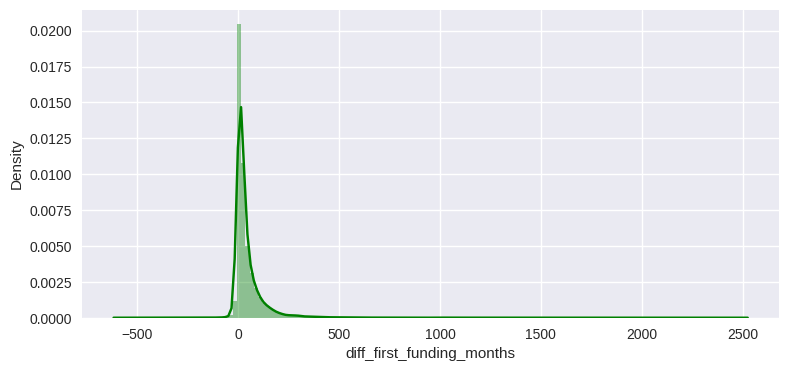

In [ ]:
print(df['diff_first_funding_months'].describe())
plt.figure(figsize=(9,4))
sns.distplot(df['diff_first_funding_months'], color='g', bins=150, hist_kws={'alpha': 0.4});

In [ ]:
df.head()

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H,country,diff_funding,diff_funding_months,diff_first_funding_months
0,/organization/waywire,#waywire,http://www.waywire.com,|Entertainment|Politics|Social Media|News|,News,1750000.0,acquired,USA,New York City,New York,1.0,2012-06-01,2012-06-30,2012-06-30,1750000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America,0 days,0.000000,0.952792
1,/organization/tv-communications,&TV Communications,http://enjoyandtv.com,|Games|,Games,4000000.0,operating,USA,Los Angeles,Los Angeles,2.0,NaT,2010-06-04,2010-09-23,0.0,4000000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America,111 days,3.646892,NaN
2,/organization/rock-your-paper,'Rock' Your Paper,http://www.rockyourpaper.org,|Publishing|Education|,Publishing,40000.0,operating,EST,Tallinn,Tallinn,1.0,2012-10-26,2012-08-09,2012-08-09,40000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Estonia,0 days,0.000000,-2.562681
3,/organization/in-touch-network,(In)Touch Network,http://www.InTouchNetwork.com,|Electronics|Guides|Coffee|Restaurants|Music|i...,Electronics,1500000.0,operating,GBR,London,London,1.0,2011-04-01,2011-04-01,2011-04-01,1500000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United Kingdom,0 days,0.000000,0.000000
4,/organization/r-ranch-and-mine,-R- Ranch and Mine,NaN,|Tourism|Entertainment|Games|,Tourism,60000.0,operating,USA,Dallas,Fort Worth,2.0,2014-01-01,2014-08-17,2014-09-26,0.0,0.0,60000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,United States Of America,40 days,1.314195,7.490914


In [ ]:
df1.groupby(df['diff_funding'])['permalink'].count().sort_index(ascending = True).head(50)

diff_funding
0 days     27047
1 days        14
2 days        13
3 days        13
4 days        10
5 days         5
6 days        11
7 days        13
8 days         1
9 days        16
10 days        9
11 days        4
12 days        6
13 days        6
14 days       11
15 days        9
16 days        9
17 days        6
18 days        9
19 days       11
20 days        6
21 days        3
22 days        3
23 days        4
24 days        4
25 days        2
26 days        5
27 days        6
28 days       16
29 days       13
30 days       14
31 days       28
32 days        6
33 days        8
34 days        2
35 days        7
36 days       10
37 days        7
38 days       11
39 days        8
40 days        7
41 days       12
42 days        5
43 days       10
44 days        9
45 days        7
46 days        4
47 days        7
48 days        7
49 days       13
Name: permalink, dtype: int64

In [ ]:
df['market'].nunique()

736

**new_feature A_to_H** Funding Round Count: Create a feature that counts the total number of funding rounds a startup has gone through. This could give an indication of the startup's funding history and stability.

In [ ]:
round_cols = [col for col in df.columns if 'round' in col]
round_cols.remove('funding_rounds')
round_cols

['round_A',
 'round_B',
 'round_C',
 'round_D',
 'round_E',
 'round_F',
 'round_G',
 'round_H']

In [ ]:
df[df['angel']!=0].iloc[-1]

permalink                         /organization/zyrra
name                                            Zyrra
homepage_url                     http://www.zyrra.com
category_list                            |E-Commerce|
market                                    E-Commerce 
funding_total_usd                           1510500.0
status                                      operating
country_code                                      USA
region                                         Boston
city                                        Cambridge
funding_rounds                                    4.0
founded_at                                        NaT
first_funding_at                  2010-10-21 00:00:00
last_funding_at                   2012-10-18 00:00:00
seed                                         495000.0
venture                                      140500.0
equity_crowdfunding                               0.0
undisclosed                                       0.0
convertible_note            

In [ ]:
rounds_df = df[round_cols].apply(lambda x: (x > 0).astype(int))
rounds_df['total'] = rounds_df['round_A'] +rounds_df['round_B'] +rounds_df['round_C'] +rounds_df['round_D'] +rounds_df['round_E'] +rounds_df['round_F'] +rounds_df['round_G'] +rounds_df['round_H']
rounds_df

In [ ]:
df['round_A_H_total'] = rounds_df['total']
df.head()

In [ ]:
"""***new_feature Average Funding Size** Average Funding Size: Calculate the average funding size per round for each startup.
funding roundsa bölüyorum çünkü bu önceki yatırımları angel hibe vs de gözetiyor. Ancak bizim hesapladığımız roundların toplamı o yüzden buna bölüyorum
"""
df['avg_fund_size'] = df['funding_total_usd'] / df['funding_rounds']
df['avg_fund_size'].head()

In [ ]:
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

In [ ]:
#founded_at filled wiht median
med_date = df['founded_at'].median()
df['founded_at'].fillna(med_date, inplace=True)

In [ ]:
df['diff_first_funding_months'] = (df['first_funding_at'] - df['founded_at'])/np.timedelta64(1, 'M')

In [ ]:
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

In [ ]:
df = df.dropna(subset=['category_list'])

In [ ]:
df = df.dropna(subset=['first_funding_at'])

In [ ]:
df = df.dropna(subset=['country'])

In [ ]:
df = df.dropna(subset=['market'])

In [ ]:
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

In [ ]:
df['avg_fund_size'] = df['funding_total_usd'] / df['funding_rounds']
df['avg_fund_size'].head()

In [ ]:
df['ratio_debt_tot'] =df['debt_financing'] / df['funding_total_usd']

In [ ]:
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

In [ ]:
df['ratio_debt_tot'].fillna(0, inplace=True)
null=pd.DataFrame(df.isnull().sum(),columns=["Null Values"])
null["% Missing Values"]=(df.isna().sum()/len(df)*100)
null = null[null["% Missing Values"] > 0]
null.style.background_gradient(cmap='viridis',low =0.2,high=0.1)

In [ ]:
df.corr()

In [ ]:
max_last_fund_date = df['last_funding_at'].max()

In [ ]:
df['recency'] = (max_last_fund_date- df["founded_at"])/np.timedelta64(1, 'M')
df.head()

In [ ]:
df['recency'].describe()

In [ ]:
df.to_pickle('report_df.pkl')

In [ ]:
non_usable_features = ["permalink","name","homepage_url","country_code","category_list" # burada country kullanacağım direct
                       "region","city","founded_at","first_funding_at","last_funding_at","diff_funding",
                       'seed',
 'venture',
 'equity_crowdfunding',
 'undisclosed',
 'convertible_note',
  'angel',
 'grant',
 'private_equity',
 'post_ipo_equity',
 'post_ipo_debt',
 'secondary_market',
 'product_crowdfunding',
 'round_A',
 'round_B',
 'round_C',
 'round_D',
 'round_E',
 'round_F',
 'round_G',
 'round_H',
 'debt_financing',] # diff funding'e de gerek yok çünkü zaten months oalrak kullanıyorum

In [ ]:
ml_features = [col for col in df.columns if col not in non_usable_features]
ml_features.remove("category_list")
ml_features.remove("region")
ml_features

In [ ]:
ml_df = df[ml_features]

In [ ]:
ml_df.to_pickle('pickle_clean_crunchbase.pkl')

In [ ]:
ml_df.head(10)

In [ ]:
df.corr()


In [ ]:
plt.figure(figsize=(30,20))
ax = sns.heatmap(data = df[ml_features].corr(),cmap='YlGnBu',annot=True)

bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5,top - 0.5)

In [ ]:
ml_cat_cols = [col for col in ml_df.columns if ml_df[col].dtypes == "O"]
ml_df[ml_cat_cols].nunique()

In [ ]:
ml_features


In [ ]:
featuresNum = ['funding_total_usd',
 'funding_rounds',
  'diff_funding_months',
 'diff_first_funding_months',
 'round_A_H_total',
 'avg_fund_size',
 'ratio_debt_tot',
 'recency']
plt.figure(figsize=(10, 5))
for i in range(0, len(featuresNum)):
    plt.subplot(1, len(featuresNum), i+1)
    sns.boxplot(y=df[featuresNum[i]], color='green', orient='v')
    plt.tight_layout()

In [ ]:
df_acquired = df[(df["status"] == 1)]
df_acquired.shape

In [ ]:
df_acquired = df[(df["status"] == 0)]
df_acquired.shape

In [ ]:
df_operating= df[(df["status"] == 2)]
df_operating.shape

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))

_ = sns.countplot(x="market", hue="status", data=ml_df, palette="nipy_spectral",
              order=df.market.value_counts().index)

_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set(xlabel="Category", ylabel="permalink")
plt.legend(bbox_to_anchor=(0.945, 0.90))

In [ ]:
funding_sorted_category = pd.pivot_table(df,
              index=['market'],
              values=['funding_total_usd'],
              aggfunc=['sum']
              ).reset_index()
funding_sorted_category.columns = ['market', 'funding_total_usd']
funding_sorted_category = funding_sorted_category.sort_values(['funding_total_usd'], ascending = False)
funding_sorted_category.head(10)

In [ ]:
fig, ax = plt.subplots(figsize=(15,7))
_ = sns.barplot(x="market", y="funding_total_usd", data=funding_sorted_category,
                palette="nipy_spectral", ax=ax)
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set(xlabel="Category", ylabel="Total Funding USD")[:20]

In [ ]:
ml_features


In [ ]:
fig, ax = plt.subplots(figsize=(12,8))

_ = sns.countplot(x="country", hue="status", data=ml_df, palette="nipy_spectral",
              order=ml_df.country.value_counts().index)

_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set(xlabel="state_code", ylabel="No. of startup")
plt.legend(bbox_to_anchor=(0.945, 0.90))

In [ ]:
trending_statea = df.groupby(['country']).size().rename('num_startup').reset_index()

most_trending_statea = trending_statea[trending_statea.groupby('country')['num_startup'].transform(max) == trending_statea['num_startup']]
most_trending_statea = most_trending_statea.sort_values('num_startup', ascending=False)
most_trending_statea

In [ ]:
ml_df.head(10)

In [ ]:

ml_df.head()

In [ ]:
ml_df['market'].value_counts().sort_values(ascending = False).head(66).sum()/ len(ml_df)

In [ ]:
main_categories = list(ml_df['market'].value_counts().sort_values(ascending = False).head(66).index)

In [ ]:
main_categories

In [ ]:
# Remove leading and trailing white spaces from each category
cleaned_categories = [category.strip() for category in main_categories]
ml_df['market'] = ml_df['market'].str.strip()
len(cleaned_categories)

In [ ]:
ml_df.loc[~ml_df['market'].isin(cleaned_categories), 'market'] = 'others'

In [ ]:
ml_df['market'].value_counts()

In [ ]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

ml_df = one_hot_encoder(ml_df,['market','country'], drop_first= False)

In [ ]:
ml_df.head()

In [ ]:
ml_df.head(10)

In [ ]:
ml_df.loc[df["status"]== 'acquired',"target"] = 1
ml_df.loc[df["status"]== 'closed',"target"] = 0
ml_df.loc[df["status"]== 'operating',"target"] = 2
ml_df.head()

In [ ]:
# Now I can drop status
ml_df = ml_df.drop('status',axis=1)
ml_df.head()

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
numeric_cols = ml_df.select_dtypes(include=['int', 'float']).columns.tolist()

print(numeric_cols)

In [ ]:
numeric_cols.remove('target')

In [ ]:
numeric_cols

In [ ]:
ml_df[numeric_cols].head()

In [ ]:
ml_df[numeric_cols] = scaler.fit_transform(ml_df[numeric_cols])
ml_df[numeric_cols].head()

In [ ]:
(ml_df['target'].value_counts()/ ml_df.shape[0])*100


In [ ]:
# Separate the majority and minority classes
minority_classes = ml_df[ml_df['target'].isin([0, 1])]  # Assuming classes 0 and 1 are minority classes
majority_class = ml_df[ml_df['target'] == 2]  # Assuming class 2 is the majority class

# Randomly select instances from the majority class
num_minority_instances = len(minority_classes)
undersampled_majority = majority_class.sample(n=num_minority_instances, random_state=42)

# Create a balanced dataset by combining the minority and undersampled majority classes
balanced_df = pd.concat([minority_classes, undersampled_majority])

# Now, balanced_df contains your downsampled, balanced dataset

In [ ]:
balanced_df['target'].value_counts()

In [ ]:
balanced_df.head()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [ ]:
#  Train ve Test verisini ayırınız. (SalePrice değişkeni boş olan değerler test verisidir.)
y = balanced_df['target']
X = balanced_df.drop("target", axis=1)

# Train verisi ile model kurup, model başarısını değerlendiriniz.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=23)



In [ ]:

from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical


In [ ]:
rf_model = RandomForestClassifier(random_state=46).fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [ ]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {round(accuracy, 2)}")

# Recall (also known as sensitivity or true positive rate)
recall = recall_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"Recall: {round(recall, 3)}")

# Precision
precision = precision_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"Precision: {round(precision, 2)}")

# F1 Score (the harmonic mean of precision and recall)
f1 = f1_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"F1: {round(f1, 2)}")

# AUC (Area Under the Receiver Operating Characteristic Curve) is not directly applicable to multiclass problems.
# If you want to compute AUC, you might need to use one-vs-all (OvA) or one-vs-one (OvO) strategies.
# Here, I'll show you how to compute it using a one-vs-all approach.
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

# Convert multiclass labels to binary format for ROC AUC calculation
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels
y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels

# Compute ROC AUC for each class separately and then average them
roc_auc = roc_auc_score(y_test_bin, y_pred_bin, average='macro')
print(f"AUC: {round(roc_auc, 2)}")

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import  cross_val_score
from sklearn.neural_network import MLPClassifier

In [ ]:
models = [('KNN', KNeighborsClassifier()),
          ('CART', DecisionTreeClassifier()),
          ('RF', RandomForestClassifier()),
          ('mlp',MLPClassifier()),
          ('SVC', SVC()),
          ('GBM', GradientBoostingClassifier()),
          ("XGBoost", XGBClassifier(objective='multi:softmax'))]

for name, classifier in models:
    print(f"MODEL:({name})")
    print("   ")
    ml_model = classifier.fit(X_train, y_train)
    y_pred = ml_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {round(accuracy, 2)}")

    # Recall (also known as sensitivity or true positive rate)
    recall = recall_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
    print(f"Recall: {round(recall, 3)}")

    # Precision
    precision = precision_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
    print(f"Precision: {round(precision, 2)}")

    # F1 Score (the harmonic mean of precision and recall)
    f1 = f1_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
    print(f"F1: {round(f1, 2)}")

    # AUC (Area Under the Receiver Operating Characteristic Curve) is not directly applicable to multiclass problems.
    # If you want to compute AUC, you might need to use one-vs-all (OvA) or one-vs-one (OvO) strategies.
    # Here, I'll show you how to compute it using a one-vs-all approach.
    from sklearn.preprocessing import label_binarize
    from sklearn.metrics import roc_auc_score

    # Convert multiclass labels to binary format for ROC AUC calculation
    y_test_bin = label_binarize(y_test, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels
    y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels

    # Compute ROC AUC for each class separately and then average them
    roc_auc = roc_auc_score(y_test_bin, y_pred_bin, average='macro')
    print(f"AUC: {round(roc_auc, 2)}")
    print("   ")

In [ ]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


In [ ]:
import warnings
warnings.simplefilter(action="ignore")

In [ ]:
base_model = GradientBoostingClassifier(random_state=46).fit(X_train, y_train)
y_pred = base_model.predict(X_test)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {round(accuracy, 2)}")

# Recall (also known as sensitivity or true positive rate)
recall = recall_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"Recall: {round(recall, 3)}")

# Precision
precision = precision_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"Precision: {round(precision, 2)}")

# F1 Score (the harmonic mean of precision and recall)
f1 = f1_score(y_test, y_pred, average='weighted')  # 'weighted' accounts for class imbalance
print(f"F1: {round(f1, 2)}")

# AUC (Area Under the Receiver Operating Characteristic Curve) is not directly applicable to multiclass problems.
# If you want to compute AUC, you might need to use one-vs-all (OvA) or one-vs-one (OvO) strategies.
# Here, I'll show you how to compute it using a one-vs-all approach.
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

# Convert multiclass labels to binary format for ROC AUC calculation
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels
y_pred_bin = label_binarize(y_pred, classes=[0, 1, 2])  # Replace [0, 1, 2] with your actual class labels

# Compute ROC AUC for each class separately and then average them
roc_auc = roc_auc_score(y_test_bin, y_pred_bin, average='macro')
print(f"AUC: {round(roc_auc, 2)}")

In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

# Assuming you have models named knn_model, cart_model, rf_model, mlp_model, svc_model, gbm_model, xgb_model

rf_model = RandomForestClassifier()
mlp_model = MLPClassifier()
svc_model = SVC(probability=True)  # Note: SVC with probability=True for soft voting
gbm_model = GradientBoostingClassifier()

# Hard Voting
voting_clf_hard = VotingClassifier(estimators=[
     ('rf', rf_model),
    ('mlp', mlp_model), ('svc', svc_model), ('gbm', gbm_model)
], voting='hard')

# Cross-validation scores
scores_hard = cross_val_score(voting_clf_hard, X, y, cv=5, scoring='accuracy')

# Print the result
print(f'Hard Voting Accuracy: {scores_hard.mean()}')


Hard Voting Accuracy: 0.6476262888954818


CROSS VALIDATION

In [ ]:
scoring_metrics = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted')
}

# Perform cross-validation
cv_results = cross_validate(
    base_model,
    X,
    y,
    cv=5,
    scoring=scoring_metrics,
    return_train_score=False
)

# Access the results for each scoring metric
accuracy_scores = cv_results['test_accuracy']
precision_scores = cv_results['test_precision']
recall_scores = cv_results['test_recall']
f1_scores = cv_results['test_f1']


# Print the results
print(f"Accuracy Scores: {accuracy_scores}")
print(f"Precision Scores: {precision_scores}")
print(f"Recall Scores: {recall_scores}")
print(f"F1 Scores: {f1_scores}")

Accuracy Scores: [0.6321055  0.65529786 0.64029104 0.66530241 0.65468608]
Precision Scores: [0.62042111 0.64303597 0.62692882 0.65534833 0.64593318]
Recall Scores: [0.6321055  0.65529786 0.64029104 0.66530241 0.65468608]
F1 Scores: [0.62301022 0.64265854 0.62943783 0.65598413 0.64762044]


HyperParameter Search

In [ ]:
grid_search_best_params = {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.7}

In [ ]:
final_model = base_model.set_params(**grid_search_best_params).fit(X, y)

In [ ]:
# Define the list of scoring metrics, including the custom ROC AUC function
scoring_metrics = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1': make_scorer(f1_score, average='weighted'),
}

# Perform cross-validation
cv_results = cross_validate(
    final_model,
    X,  # Your feature matrix
    y,  # Your target vector
    cv=5,  # Number of cross-validation folds
    scoring=scoring_metrics,
    return_train_score=False
)

# Access the results for each scoring metric
accuracy_scores = cv_results['test_accuracy']
precision_scores = cv_results['test_precision']
recall_scores = cv_results['test_recall']
f1_scores = cv_results['test_f1']  # Access neg_log_loss scores



In [ ]:
print(f"Accuracy Scores: {accuracy_scores.mean()}")
print(f"Precision Scores: {precision_scores.mean()}")
print(f"Recall Scores: {recall_scores.mean()}")
print(f"F1 Scores: {f1_scores.mean()}")

Accuracy Scores: 0.651264223418619
Precision Scores: 0.6409683974933583
Recall Scores: 0.651264223418619
F1 Scores: 0.6431185584011064


In [ ]:
final_model = base_model.set_params(**grid_search_best_params).fit(X, y)

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=23)

y_pred = final_model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Assuming you have already made predictions with 'y_test_pred' and you have ground truth labels 'y_test'

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision (weighted)
precision = precision_score(y_test, y_pred, average='weighted')

# Calculate recall (weighted)
recall = recall_score(y_test, y_pred, average='weighted')

# Calculate F1 score (weighted)
f1 = f1_score(y_test, y_pred, average='weighted')

# Print or use the metrics as needed
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.723055934515689
Precision: 0.7169004101765807
Recall: 0.723055934515689
F1 Score: 0.7175815701640613


            Value                                            Feature
7    2.940729e-01                                            recency
3    2.366727e-01                          diff_first_funding_months
0    1.077014e-01                                  funding_total_usd
2    9.415235e-02                                diff_funding_months
5    6.365315e-02                                      avg_fund_size
4    2.587072e-02                                    round_A_H_total
182  2.298482e-02                   country_United States Of America
14   1.125314e-02                               market_Biotechnology
97   9.584007e-03                                      country_China
6    9.265513e-03                                     ratio_debt_tot
19   8.602710e-03                                 market_Curated Web
1    8.418119e-03                                     funding_rounds
15   5.575495e-03                            market_Clean Technology
94   4.413310e-03                 

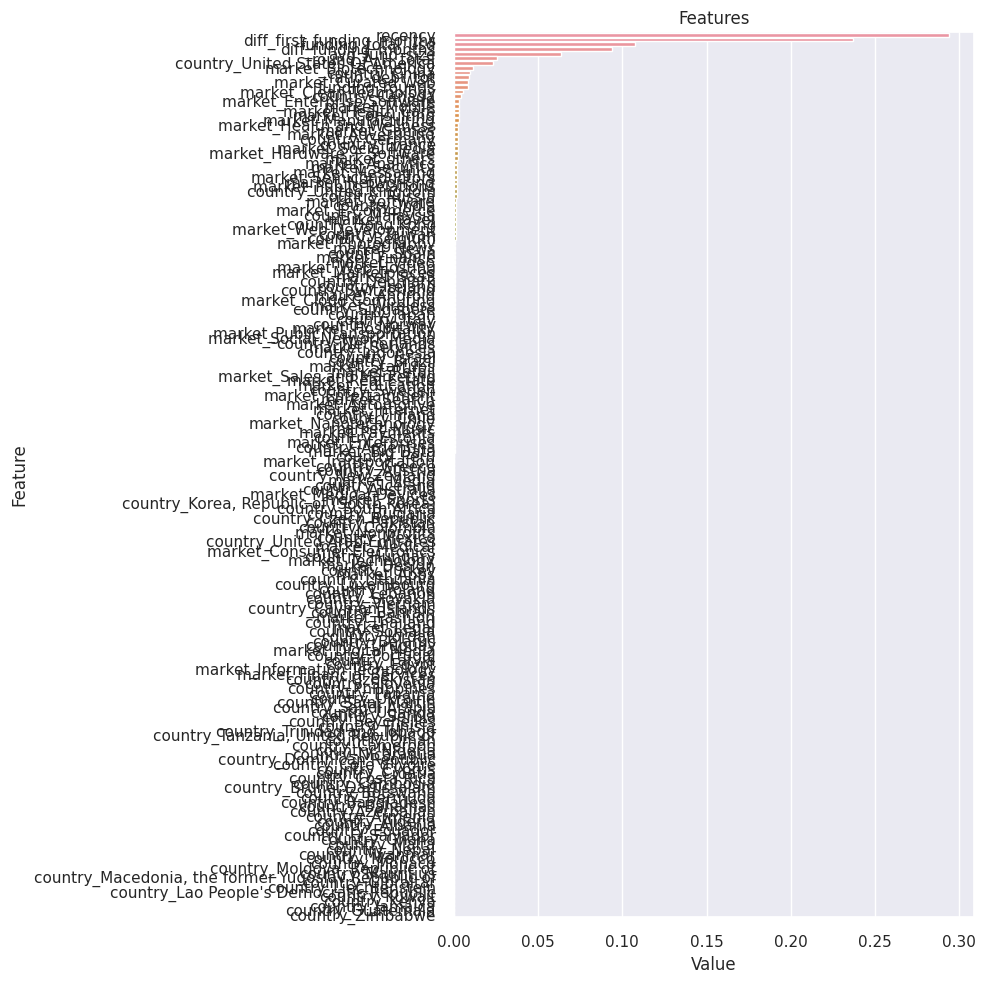

In [ ]:
def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    print(feature_imp.sort_values("Value",ascending=False))
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

plot_importance(final_model, X)

In [ ]:
feature_imp = pd.DataFrame({'Value': final_model.feature_importances_, 'Feature': X.columns})
most_important= feature_imp.sort_values("Value",ascending=False)[:20]

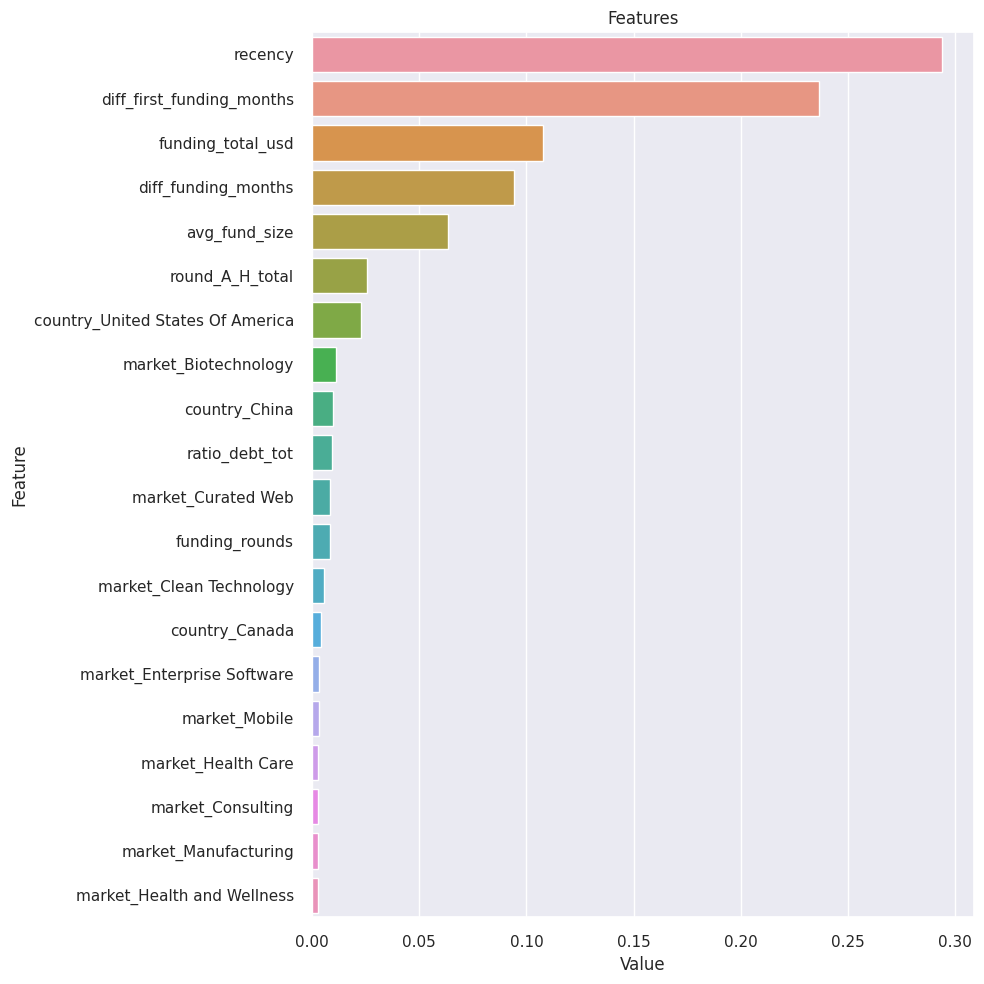

In [ ]:
plt.figure(figsize=(10, 10))
sns.set(font_scale=1)
sns.barplot(x="Value", y="Feature", data=most_important)
plt.title('Features')
plt.tight_layout()
plt.show()

In [ ]:
feature_imp.to_csv('feature_imp.csv', index=False)

In [ ]:
import pickle
with open('final_model.pkl', 'wb') as model_file:
    pickle.dump(final_model, model_file)

In [ ]:
with open('x_test.pkl', 'wb') as model_file:
    pickle.dump(X_test, model_file)

In [ ]:
with open('balanced_df.pkl', 'wb') as model_file:
    pickle.dump(balanced_df, model_file)

In [ ]:
balanced_df.to_csv('balanced_df.csv', index=False)

In [ ]:
df.to_csv('visualsdf.csv', index=False)